**TRABAJO PRACTICO 3**


In [ ]:
#Instalacion de librerias
!pip3 install xlrd
!pip3 install openpyxl
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, confusion_matrix, recall_score, precision_score, auc, roc_auc_score, classification_report, roc_curve
from sklearn.linear_model import LogisticRegression, LogisticRegressionCV
from sklearn.preprocessing import OneHotEncoder, StandardScaler, LabelEncoder
import plotly.express as px

Para el corriente desafio vamos a trabajar con una base bancaria, que posee informacion referida a los movimientos bancarios realizados
tanto por personas como por empresas. El objetivo es poder identificar si la accion monetaria realizada va a ser Justificada o Injustificada por la entidad bancaria. En el caso de ser Injustificada el banco va a realizar un estudio mas minucioso para determinar si es necesario denunciar a la 
persona o a la empresa.

La base posee las siguentes variables: 
- **VA_Fecha_Gen_Vigia**: fecha de generacion de la alerta.
- **Alta - Alerta**: relacion entre la fecha del alta del cliente y la fecha de generacion de la alerta en años.
- **Codigo** : nombre de la empresa
- **estado_cliente_tx**: activo: cliente vigente inscripto en banco(vigente si tiene productos como tarjeta o plazo fijo a su nombre)
	                     inactivo: cliente no vigente incripto en el banco
	                     ex cliente: de baja en el banco
- **tipo_persona_tx** : Juridica: empresa
	                    fisica: persona real
- **segmento_tx** : segunda clasificacion. Se segmenta en funcion de la actividad en que se registra(banca_tx) y el tamaño de la persona
- **banca_tx**: segmento dado en funcion de su composicion juridica. Primera segmentacion.
- **actividad_bgba_tx**: actividad con la que registran en el banco.
- **actividad_afip_tx**: actividad con la que se registran en afip.
- **alta_cliente_fc**: fecha de alta del cliente.
- **Antigüedad_Años**: antiguedad en años del cliente.
- **VA_Ult_Estado_Alerta**: TARGET. Si la alerta es justificada o no: 'JUSTI' o 'INUSU'.
- **Indicador_SO**: Si es un sujeto obligado(que presenta documentacion en afip): 0 o 1.
- **Indicador_PEP**: Si es una persona expuesta publicamente: 0 o 1.
- **Monto_Operado**: Monto que opera un cliente en el periodo de un año(depositos o tranferencias tomando el mas alto).
- **Perfil**: lo que deberia mover.
- **Limite_Aceptado**: es el limite que asigna el banco para que surja alerta.


In [ ]:
df = pd.read_excel("../Bases/Base_banco.xlsx",engine='openpyxl')
df.head()

,VA_Fecha_Gen_Vigia,Alta - Alerta,Codigo,estado_cliente_tx,tipo_persona_tx,segmento_tx,banca_tx,actividad_bgba_tx,actividad_afip_tx,alta_cliente_fc,Antigüedad_Años,VA_Ult_Estado_Alerta,Indicador_SO,Indicador_PEP,Monto_Operado,Perfil,Limite_Aceptado
0,2022-10-21,4.134247,R L 154375. 3.39023228988889E 009CA,Activo,Juridica,PYME PES,Empresas,"VTA POR MAYOR ART. P/ HOGAR, USO DOMEST. Y/O P...","VENTA AL POR MAYOR DE ARTMCULOS DE RELOJERMA, ...",2018-09-03,4.161644,JUSTI,0,0,73741228,48579737,7.286961e+07
1,2022-10-21,11.553425,SA 154375. 3.40129500900000E 009BA,Activo,Juridica,PYME PES,Empresas,FAB. DE CALZADO Y/O SUS PARTES,FABRICACISN DE PARTES DE CALZADO ...,2011-04-05,11.580822,JUSTI,0,0,1006168239,820540214,9.928537e+08
2,2022-10-21,14.309589,SA 154374. 3.40117725955556E 009AL,Activo,Juridica,PYME PES,Empresas,FAB. PRODUCTOS DE PLASTICO - OTROS,FABRICACISN DE PRODUCTOS PLASTICOS EN FORMAS B...,2008-07-03,14.336986,JUSTI,0,0,232214482,172281045,2.274110e+08
3,2022-10-21,8.419178,IAL 154376. 3.73493918655556E 009DE,Activo,Juridica,PYME PES,Empresas,VTA POR MAYOR DE ALIMENTOS Y/O BEBIDAS Y/O TABACO,VENTA AL POR MAYOR DE ALIMENTOS BALANCEADOS PA...,2014-05-23,8.446575,JUSTI,0,0,199942041,92957665,1.227041e+08
4,2022-10-21,8.230137,SA 154376. 3.40077955811111E 009IM,Activo,Juridica,PYME PES,Empresas,"VTA. POR MAYOR PROD. FARM,VET,ORTOP,INSTRUM.MÉ...",VENTA AL POR MAYOR DE INSTRUMENTAL MIDICO Y OD...,2014-07-31,8.257534,JUSTI,0,0,101726471,66472668,9.970900e+07


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 42186 entries, 0 to 42185
Data columns (total 17 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   VA_Fecha_Gen_Vigia    42186 non-null  datetime64[ns]
 1   Alta - Alerta         42186 non-null  float64       
 2   Codigo                42186 non-null  object        
 3   estado_cliente_tx     42186 non-null  object        
 4   tipo_persona_tx       42186 non-null  object        
 5   segmento_tx           42186 non-null  object        
 6   banca_tx              42186 non-null  object        
 7   actividad_bgba_tx     42186 non-null  object        
 8   actividad_afip_tx     42186 non-null  object        
 9   alta_cliente_fc       42186 non-null  datetime64[ns]
 10  Antigüedad_Años       42186 non-null  float64       
 11  VA_Ult_Estado_Alerta  42186 non-null  object        
 12  Indicador_SO          42186 non-null  int64         
 13  Indicador_PEP   

In [ ]:
df.describe()

,Alta - Alerta,Antigüedad_Años,Indicador_SO,Indicador_PEP,Monto_Operado,Perfil,Limite_Aceptado
count,42186.000000,42186.000000,42186.000000,42186.000000,4.218600e+04,4.218600e+04,4.218600e+04
mean,8.684057,9.679584,0.093467,0.007728,1.400310e+08,7.346373e+07,8.674921e+07
std,5.472235,5.471369,0.291089,0.087568,1.564905e+09,9.326963e+08,1.037123e+09
min,-1.553425,0.049315,0.000000,0.000000,1.200002e+07,1.000000e+00,1.200000e+00
25%,3.649315,4.654795,0.000000,0.000000,1.887809e+07,2.430520e+06,3.388100e+06
50%,8.350685,9.309589,0.000000,0.000000,2.966342e+07,1.200000e+07,1.560000e+07
75%,14.358904,15.572603,0.000000,0.000000,6.139182e+07,2.839240e+07,3.843360e+07
max,20.868493,21.071233,1.000000,1.000000,9.681881e+10,8.549005e+10,9.403905e+10


In [ ]:
plt.figure(figsize=(20,15))
fig = px.scatter(data_frame=df, x =  "Antigüedad_Años", y = "Monto_Operado", color ="VA_Ult_Estado_Alerta")
fig.show()

<Figure size 1440x1080 with 0 Axes>

<AxesSubplot:xlabel='Antigüedad_Años', ylabel='Count'>

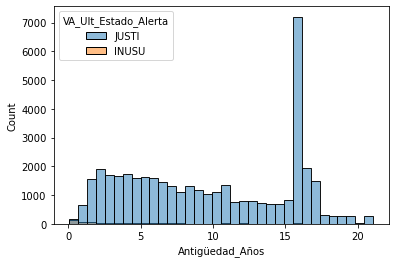

In [ ]:
sns.histplot(data=df, x="Antigüedad_Años", hue=  "VA_Ult_Estado_Alerta")

In [ ]:
px.histogram(data_frame= df, x="Antigüedad_Años",color=  "VA_Ult_Estado_Alerta")

In [ ]:
px.box(data_frame= df, x= "VA_Ult_Estado_Alerta", y = "Antigüedad_Años")

In [ ]:
px.box(data_frame= df, x= "VA_Ult_Estado_Alerta", y = "Alta - Alerta")

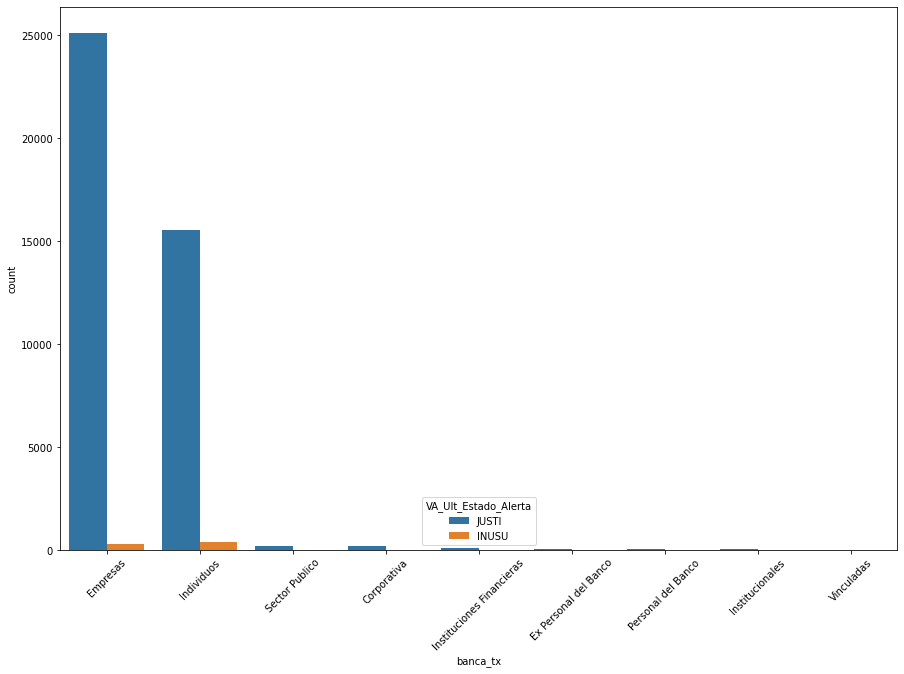

In [ ]:
plt.figure(figsize=(15,10))
chart = sns.countplot(x=df['banca_tx'], hue=df['VA_Ult_Estado_Alerta'])
chart.set_xticklabels(chart.get_xticklabels(), rotation=45)
plt.show()

In [ ]:
#Se van a eliminar las columnas que no vamos a utilizar en el modelo, algunas redundantes y otras que no aportan informacion relevante
df_corta = df.drop(columns=["VA_Fecha_Gen_Vigia", "Codigo","segmento_tx","alta_cliente_fc","actividad_bgba_tx",	"actividad_afip_tx" ], axis = 1)
df_corta.head()

,Alta - Alerta,estado_cliente_tx,tipo_persona_tx,banca_tx,Antigüedad_Años,VA_Ult_Estado_Alerta,Indicador_SO,Indicador_PEP,Monto_Operado,Perfil,Limite_Aceptado
0,4.134247,Activo,Juridica,Empresas,4.161644,JUSTI,0,0,73741228,48579737,7.286961e+07
1,11.553425,Activo,Juridica,Empresas,11.580822,JUSTI,0,0,1006168239,820540214,9.928537e+08
2,14.309589,Activo,Juridica,Empresas,14.336986,JUSTI,0,0,232214482,172281045,2.274110e+08
3,8.419178,Activo,Juridica,Empresas,8.446575,JUSTI,0,0,199942041,92957665,1.227041e+08
4,8.230137,Activo,Juridica,Empresas,8.257534,JUSTI,0,0,101726471,66472668,9.970900e+07


In [ ]:
round(df_corta["VA_Ult_Estado_Alerta"].value_counts(normalize = True)*100)

JUSTI    98.0
INUSU     2.0
Name: VA_Ult_Estado_Alerta, dtype: float64

In [ ]:
df_corta["VA_Ult_Estado_Alerta"] = np.where(df_corta["VA_Ult_Estado_Alerta"] == "INUSU", 1,0 )

In [ ]:
X = df_corta.drop(columns="VA_Ult_Estado_Alerta", axis = 1)
y = df_corta["VA_Ult_Estado_Alerta"]

In [ ]:
X = pd.get_dummies(X, columns= ["estado_cliente_tx", "tipo_persona_tx","banca_tx"], drop_first= True)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, stratify = y, random_state = 42)

In [ ]:
scaler = StandardScaler()
X_train = pd.DataFrame(scaler.fit_transform(X_train), columns= X_train.columns)
X_test = pd.DataFrame(scaler.transform(X_test), columns= X_test.columns)

**MODELO REGRESION LOGISTICA**

In [ ]:
modelo = LogisticRegression()

In [ ]:
modelo.fit(X_train, y_train)
y_pred = modelo.predict(X_test)
print(classification_report(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.98      1.00      0.99     12436
           1       0.43      0.10      0.17       220

    accuracy                           0.98     12656
   macro avg       0.71      0.55      0.58     12656
weighted avg       0.97      0.98      0.98     12656

[[12406    30]
 [  197    23]]


c:\Users\valen\anaconda3\envs\dhdsblend2021\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



In [ ]:
param = {"penalty" : ["l1", "l2", "elasticnet", "none"],#penalty para regularizacion
         "dual" : [True, False], # solo se implementa para una penalty l2
         "C" : np.arange(0.1, 1, 0.1),#valor de la regularizacion
         "fit_intercept" : [True, False],
         "class_weight" : ["balanced"],#peso de la clase: que sea balanceada
         "solver" : ["newton-cg", "lbfgs", "liblinear", "saga", "sag"]}#algoritmo a usar en el problema de optimizacion. 
         

In [ ]:
grid = GridSearchCV(modelo, param_grid = param, cv = 10, scoring = "roc_auc", n_jobs = 4)
grid.fit(X_train, y_train)

GridSearchCV(cv=10, estimator=LogisticRegression(), n_jobs=4,
             param_grid={'C': array([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]),
                         'class_weight': ['balanced'], 'dual': [True, False],
                         'fit_intercept': [True, False],
                         'penalty': ['l1', 'l2', 'elasticnet', 'none'],
                         'solver': ['newton-cg', 'lbfgs', 'liblinear', 'saga',
                                    'sag']},
             scoring='roc_auc')

In [ ]:
print(grid.best_params_)
print(grid.best_score_)

{'C': 0.7000000000000001, 'class_weight': 'balanced', 'dual': False, 'fit_intercept': False, 'penalty': 'l1', 'solver': 'liblinear'}
0.8078210875267493


In [ ]:
modelo_log = LogisticRegression(C = 0.8, class_weight = 'balanced', dual = False, fit_intercept = False, penalty= 'l1', solver= 'liblinear')

In [ ]:
modelo_log.fit(X_train, y_train)
y_pred_grid = modelo_log.predict(X_test)
print(classification_report(y_test, y_pred_grid))
print(confusion_matrix(y_test, y_pred_grid))

              precision    recall  f1-score   support

           0       1.00      0.52      0.68     12436
           1       0.03      0.88      0.06       220

    accuracy                           0.52     12656
   macro avg       0.51      0.70      0.37     12656
weighted avg       0.98      0.52      0.67     12656

[[6419 6017]
 [  26  194]]


**MODELO ARBOL DE DECISION**

In [ ]:
modelo = DecisionTreeClassifier()

In [ ]:
modelo.fit(X_train,y_train)
y_pred = modelo.predict(X_test)
print(classification_report(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.99      0.98      0.98     12436
           1       0.16      0.17      0.16       220

    accuracy                           0.97     12656
   macro avg       0.57      0.58      0.57     12656
weighted avg       0.97      0.97      0.97     12656

[[12238   198]
 [  183    37]]


In [ ]:
print(f"Profundidad del árbol: {modelo.get_depth()}")

Profundidad del árbol: 35


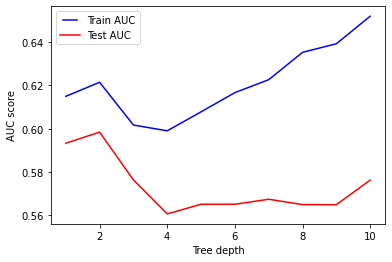

In [ ]:
max_depths = np.linspace(1, 10, 10, endpoint=True)
train_results = []
test_results = []
for max_depth in max_depths:
   dt = DecisionTreeClassifier(max_depth=max_depth)
   dt.fit(X_train, y_train)
   train_pred = dt.predict(X_train)
   false_positive_rate, true_positive_rate, thresholds = roc_curve(y_train, train_pred)
   roc_auc = auc(false_positive_rate, true_positive_rate)
   # Add auc score to previous train results
   train_results.append(roc_auc)
   y_pred = dt.predict(X_test)
   false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
   roc_auc = auc(false_positive_rate, true_positive_rate)
   # Add auc score to previous test results
   test_results.append(roc_auc)
from matplotlib.legend_handler import HandlerLine2D
line1, = plt.plot(max_depths, train_results, "b", label="Train AUC")
line2, = plt.plot(max_depths, test_results, "r", label="Test AUC")
plt.legend(handler_map={line1: HandlerLine2D(numpoints=2)})
plt.ylabel("AUC score")
plt.xlabel("Tree depth")
plt.show()

In [ ]:
param = {"criterion" :["gini", "entropy"], #funcion para medir la calidad del split
         "splitter" :["best", "random"], #estrategia usada para escoger el slipt en cada nodo
         "max_depth" : np.linspace(1, 10, 10, endpoint=True),#la profundidad del arbol
         "class_weight" : ["balanced"], #peso de la clase, elegimos balanceada
         'min_samples_leaf': [5, 10, 20, 50, 100], #numero minimo de muestras requeridas en cada hoja
         "min_samples_split": [2,5,7,10]} #el numero minimo de muestras requeridas para el split

In [ ]:
modelo_grid = GridSearchCV(modelo, param_grid= param, cv= 10, scoring= "roc_auc", n_jobs= 3)
modelo_grid.fit(X_train, y_train)

GridSearchCV(cv=10, estimator=DecisionTreeClassifier(), n_jobs=3,
             param_grid={'class_weight': ['balanced'],
                         'criterion': ['gini', 'entropy'],
                         'max_depth': array([ 1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10.]),
                         'min_samples_leaf': [5, 10, 20, 50, 100],
                         'min_samples_split': [2, 5, 7, 10],
                         'splitter': ['best', 'random']},
             scoring='roc_auc')

In [ ]:
print(modelo_grid.best_params_)
print(modelo_grid.best_score_)

{'class_weight': 'balanced', 'criterion': 'gini', 'max_depth': 6.0, 'min_samples_leaf': 50, 'min_samples_split': 2, 'splitter': 'best'}
0.7985236265009247


In [ ]:
modelo_2 = DecisionTreeClassifier(class_weight = 'balanced', criterion = 'gini', max_depth = 6.0, min_samples_leaf = 50, min_samples_split = 2, splitter = 'best')

In [ ]:
modelo_2.fit(X_train, y_train)
y_pred_grid = modelo_2.predict(X_test)
print(classification_report(y_test, y_pred_grid))
print(confusion_matrix(y_test, y_pred_grid))

              precision    recall  f1-score   support

           0       0.99      0.74      0.85     12436
           1       0.04      0.69      0.08       220

    accuracy                           0.74     12656
   macro avg       0.52      0.71      0.47     12656
weighted avg       0.98      0.74      0.84     12656

[[9219 3217]
 [  69  151]]


In [ ]:
roc_auc_score(y_test,y_pred_grid)

0.7138395859528057

In [ ]:
importance_df = pd.DataFrame({
    'feature': X_train.columns,
    'importance': modelo_2.feature_importances_
}).sort_values('importance', ascending=False)

print(importance_df.head())

              feature  importance
1     Antigüedad_Años    0.468744
4       Monto_Operado    0.210572
0       Alta - Alerta    0.156160
5              Perfil    0.080832
13  banca_tx_Empresas    0.045405


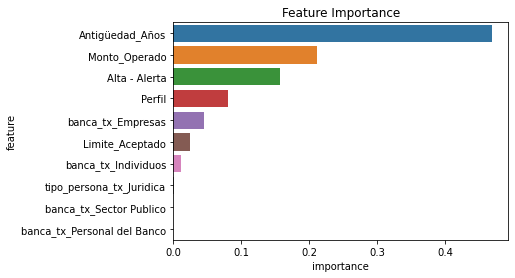

In [ ]:

plt.title('Feature Importance')

sns.barplot(data = importance_df.head(10), x='importance', y='feature');

In [ ]:
lista_rocauc_train = []
lista_rocauc_test = []

max_depths = [1,2,3,4,5,6,7,8,9,10]

for max_depth in max_depths:
    clf = DecisionTreeClassifier(max_depth = max_depth,class_weight = 'balanced', criterion = 'gini',  min_samples_leaf = 50, min_samples_split = 7, splitter = 'best', random_state= 42)
    clf.fit(X_train, y_train)
    y_train_pred = clf.predict(X_train)
    train_acc = roc_auc_score(y_train, y_train_pred)
    y_test_pred = clf.predict(X_test)
    test_acc = roc_auc_score(y_test, y_test_pred)
    lista_rocauc_train.append(train_acc)
    lista_rocauc_test.append(test_acc)

Text(0.5, 0, 'Profundidad del arbol')

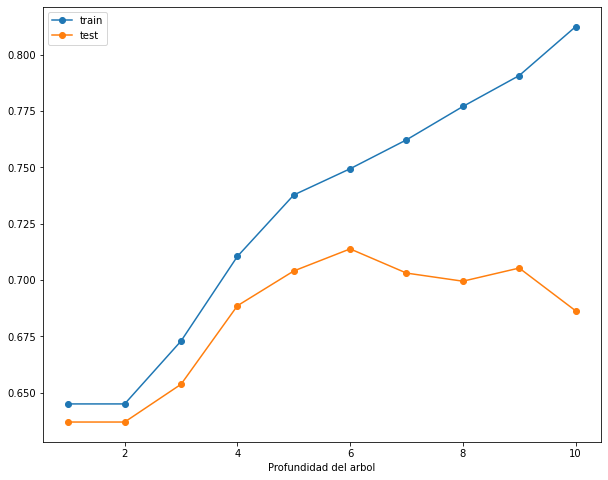

In [ ]:
plt.figure(figsize =(10,8))
plt.plot(max_depths,lista_rocauc_train, "o-", label = "train" )
plt.plot(max_depths, lista_rocauc_test, "o-", label = "test")
plt.legend()
plt.xlabel("Profundidad del arbol")